# Expriment 1: Tweak the contrast function

Remove second `exp` (in ConstrastManagerV2)

In [13]:
import os

# Set environment variables for training script
SCENE_NAME='Apartment_release_golden_skeleton_seq100_10s_sample'
ADT_PROCESSED_ROOT='/home/ubuntu/cs-747-project/adt_processed'
OUT_PATH='/home/ubuntu/cs-747-project/output/adt'
FOLDER_NAME='unc_2d_unet_egolifter_contrast_v2'

os.environ.update({
    "SCENE_NAME":         SCENE_NAME,
    "ADT_PROCESSED_ROOT": ADT_PROCESSED_ROOT,
    "OUT_PATH":           OUT_PATH,
    "FOLDER_NAME":        FOLDER_NAME,
})

In [2]:
# Run the training script. Use constrast v2 
!uv run python ../train_lightning.py \
	scene.scene_name=${SCENE_NAME} \
    scene.data_root=${ADT_PROCESSED_ROOT} \
    model=unc_2d_unet \
    model.unet_acti=sigmoid \
    model.dim_extra=16 \
    lift.use_contr=True \
    lift.name=v2 \
    exp_name=egolifter_contrast_v2 \
    output_root=${OUT_PATH} \
    wandb.project=egolifter_adt

/home/ubuntu/egolifter/.venv/bin/python3: can't open file '/home/ubuntu/egolifter/../train_lightning.py': [Errno 2] No such file or directory


# View results

In [ ]:
# Select one of the output folder from below
os.environ.update({
    "FOLDER_NAME": "unc_2d_unet_egolifter_contrast_v2",
})

!echo "Running with folder name: ${OUT_PATH}/${SCENE_NAME}/${FOLDER_NAME}"

# This will start a local server 
# open the browser and go to the link for visualization
!uv run python ../viewer.py \
    ${OUT_PATH}/${SCENE_NAME}/${FOLDER_NAME} \
    --data_root ${ADT_PROCESSED_ROOT}  \
    --reorient disable \
    --feat_pca

# Load the model and explore learned features

In [18]:
import sys, os
sys.path.append(os.path.join(os.path.dirname(os.getcwd())))

from utils.routines import load_from_model_path

model_path = f'{OUT_PATH}/{SCENE_NAME}/{FOLDER_NAME}'
source_path= f'{ADT_PROCESSED_ROOT}/{SCENE_NAME}'

model, scene, cfg = load_from_model_path(
    model_path,
    source_path
)

Overriding source_path to /home/ubuntu/cs-747-project/adt_processed/Apartment_release_golden_skeleton_seq100_10s_sample
Found global_points.csv.gz file, assuming Aria data set!
Using cameras: {'rgb'}
Loaded #3dPoints: 61357
Loading the semantic segmentation info
Found 170 images for train subset.
Found 43 images for valid subset.
Found 27 images for valid_novel subset.
Found 27 images for test subset.
Found 213 images for trainvalid subset.
Found 54 images for novel subset.
Found 240 images for all subset.
Initializing ContrastiveManagerV2...
Initializing U-Net...
Loading checkpoint from /home/ubuntu/cs-747-project/output/adt/Apartment_release_golden_skeleton_seq100_10s_sample/unc_2d_unet_egolifter_contrast_v2/chkpntstep=30000.ckpt


/home/ubuntu/egolifter/utils/system_utils.py:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(ckpt_path, map_location="cpu")


         Feature_0    Feature_1    Feature_2    Feature_3    Feature_4  \
count  6867.000000  6867.000000  6867.000000  6867.000000  6867.000000   
mean      0.009940     0.180632     0.040618     0.186070    -0.143227   
std       1.761264     1.767226     1.802116     1.811218     1.799755   
min     -12.225293    -7.826238    -8.524185   -11.072292   -10.217581   
25%      -0.808944    -0.569728    -0.833733    -0.574472    -1.059001   
50%       0.000002     0.000604     0.000218     0.000538    -0.000388   
75%       0.848425     1.058537     0.915388     1.119308     0.664865   
max       9.518421     8.433610    11.212149    10.870678     9.184766   

         Feature_5    Feature_6    Feature_7    Feature_8    Feature_9  \
count  6867.000000  6867.000000  6867.000000  6867.000000  6867.000000   
mean      0.226889     0.196036    -0.041035     0.016861    -0.129639   
std       1.732705     1.794143     1.789360     1.835987     1.822130   
min     -10.085919    -9.890795    -9

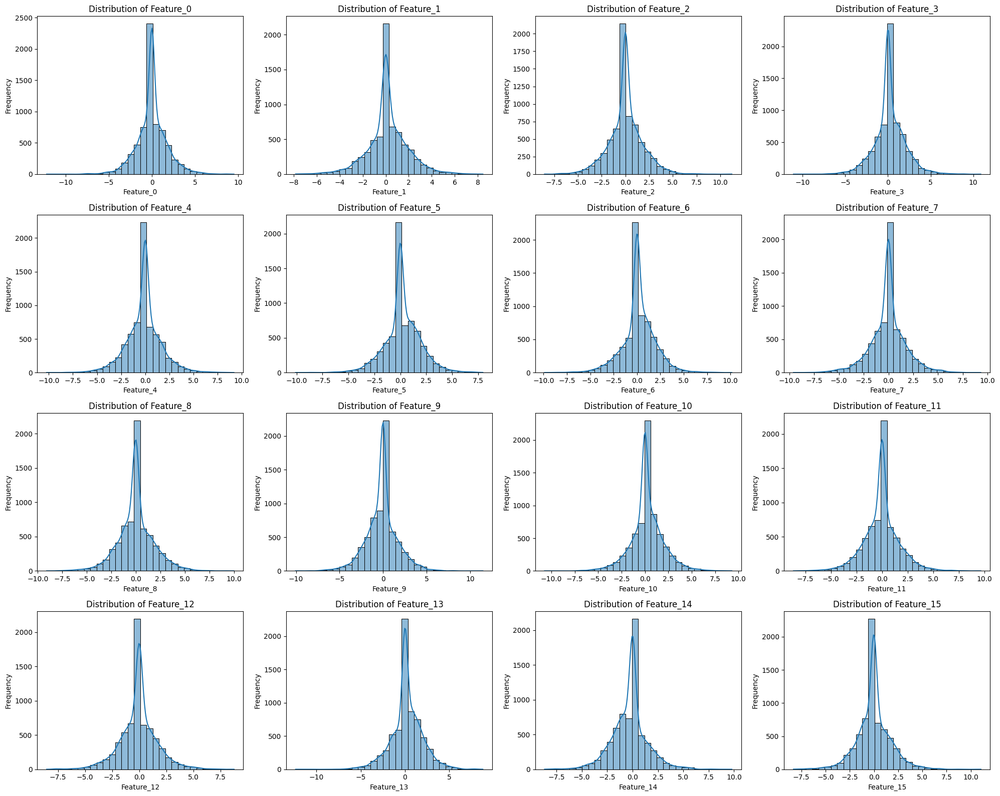

In [20]:
# Print data statistics summary using pandas
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Load the data
data = model.gaussians.get_features_extra.detach().cpu().numpy()
# Convert to DataFrame
df = pd.DataFrame(data, columns=[f'Feature_{i}' for i in range(data.shape[1])])
# Print the first few rows
# print(df.head())
# Print the summary statistics
print(df.describe())
# Plot the distribution of each feature in a grid
num_features = len(df.columns)
num_cols = 4  # Number of columns in the grid
num_rows = (num_features + num_cols - 1) // num_cols  # Calculate required rows

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 4 * num_rows))
axes = axes.flatten()

for i, column in enumerate(df.columns):
    sns.histplot(df[column], bins=30, kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

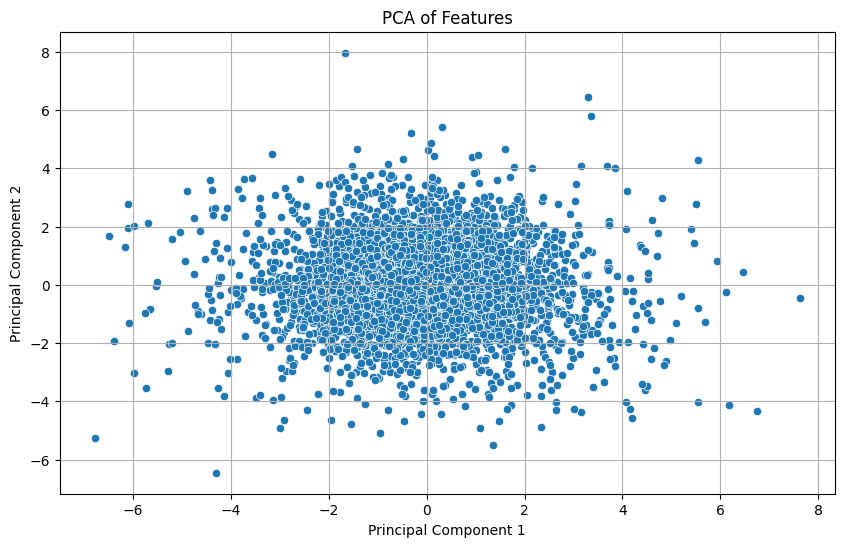

In [21]:
# Perform PCA
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Load the data
data = model.gaussians.get_features_extra.detach().cpu().numpy()
# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)
# Perform PCA
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_scaled)
# Create a DataFrame for the PCA results
df_pca = pd.DataFrame(data_pca, columns=['PC1', 'PC2'])
# Plot the PCA results
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', data=df_pca)
plt.title('PCA of Features')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid()
plt.show()

# T-SNE

## T-SNE 2D

In [24]:
# We need the data to be standardized
data_standardized = StandardScaler().fit_transform(data)

In [25]:
from sklearn.neighbors import NearestNeighbors

# Calculate the neighborhoods in the embedding space
data_standardized = StandardScaler().fit_transform(data)
knn = NearestNeighbors(n_neighbors=15, metric="cosine").fit(data_standardized)
knn_graph = knn.kneighbors_graph(mode="distance")     # sparse matrix

/home/ubuntu/egolifter/.venv/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


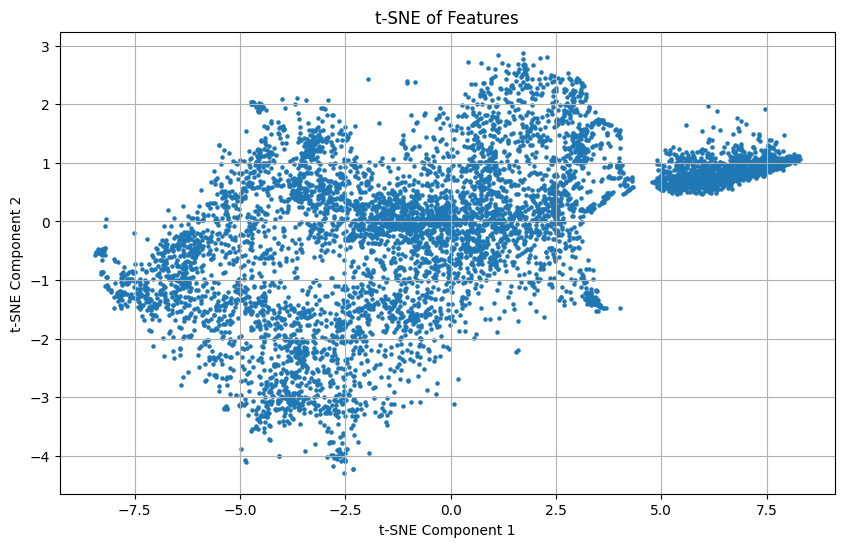

In [26]:
# Calculate tsne
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, perplexity=30, n_iter=300, random_state=42)
X_tsne = tsne.fit_transform(data_standardized)
# Plot the t-SNE results
plt.figure(figsize=(10, 6))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], s=5)
plt.title('t-SNE of Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.grid()
plt.show()

/home/ubuntu/egolifter/.venv/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



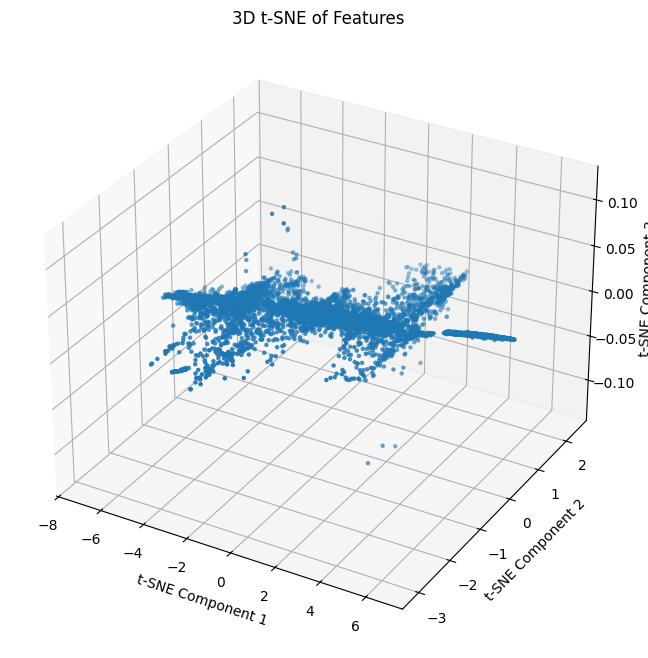

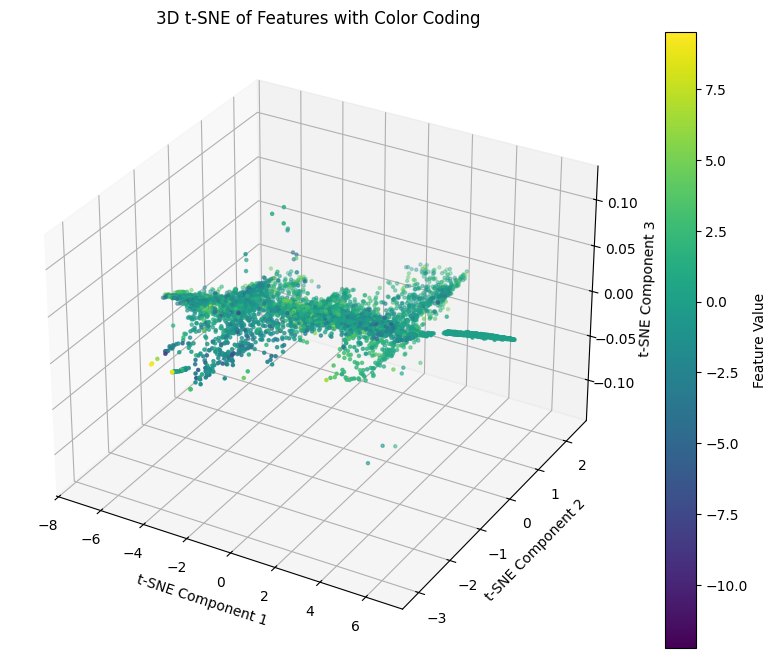

In [31]:
# 3D t-SNE
# from mpl_toolkits.mplot3d import Ax
# import Axes3D
from mpl_toolkits.mplot3d import Axes3D

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

# Load the data
data = model.gaussians.get_features_extra.detach().cpu().numpy()
# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Perform t-SNE
tsne = TSNE(n_components=3, perplexity=30, n_iter=300, random_state=42)
X_tsne = tsne.fit_transform(data_scaled)

# Plot the t-SNE results in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_tsne[:, 0], X_tsne[:, 1], X_tsne[:, 2], s=5)
ax.set_title('3D t-SNE of Features')
ax.set_xlabel('t-SNE Component 1')
ax.set_ylabel('t-SNE Component 2')
ax.set_zlabel('t-SNE Component 3')
plt.show()

# Plot the t-SNE results in 3D with color coding
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_tsne[:, 0], X_tsne[:, 1], X_tsne[:, 2], c=data[:, 0], cmap='viridis', s=5)
ax.set_title('3D t-SNE of Features with Color Coding')
ax.set_xlabel('t-SNE Component 1')
ax.set_ylabel('t-SNE Component 2')
ax.set_zlabel('t-SNE Component 3')
plt.colorbar(ax.collections[0], ax=ax, label='Feature Value')
plt.show()

# Create an interactive 3D plot using Plotly



## T-SNE 3D

In [39]:
from sklearn.manifold import TSNE
import plotly.express as px

# Compute 3D t-SNE embeddings
tsne = TSNE(n_components=3, perplexity=30, max_iter=300, random_state=42)
X_tsne = tsne.fit_transform(data_standardized)

In [40]:

# Create an interactive 3D scatter plot with Plotly
fig = px.scatter_3d(
    x=X_tsne[:, 0],
    y=X_tsne[:, 1],
    z=X_tsne[:, 2],
    color=data[:, 0],  # Adjust the feature for color-coding as needed
    labels={'x': 'TSNE Component 1', 
            'y': 'TSNE Component 2', 
            'z': 'TSNE Component 3'},
    title='Interactive 3D t-SNE Plot of Features'
)
fig.show()

# UMAP

Another way to vizualize the groupings.

In [27]:
import umap

umap2d = umap.UMAP(
    n_neighbors=15,        # matches knn above
    min_dist=0.1,          # 0 → tighter clusters, >0.4 → looser
    metric="cosine"
).fit_transform(data_standardized)

/home/ubuntu/egolifter/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [28]:
import hdbscan
labels = hdbscan.HDBSCAN(min_cluster_size=20, metric="euclidean").fit_predict(umap2d)

/home/ubuntu/egolifter/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/ubuntu/egolifter/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [29]:
import plotly.express as px
fig = px.scatter(x=umap2d[:,0], y=umap2d[:,1],
                 color=labels.astype(str),
                 #hover_data=dict(index=list(range(len(data)))),
                 )
fig.show()